In [6]:
print("working")

working


In [8]:
!python -m pip install --upgrade pip

!pip install supervision==0.3.0

!pip install transformers

!pip install pytorch-lightning

!pip install timm

!pip install cython

!pip install pycocotools

!pip install scipy

  Using cached supervision-0.3.0-py3-none-any.whl.metadata (6.4 kB)
  Using cached opencv_python-4.11.0.86-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
  Using cached matplotlib-3.10.3-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (11 kB)
  Using cached contourpy-1.3.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (5.5 kB)
Using cached supervision-0.3.0-py3-none-any.whl (21 kB)
Using cached matplotlib-3.10.3-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (8.6 MB)
Using cached contourpy-1.3.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (325 kB)
Using cached opencv_python-4.11.0.86-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (63.0 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/4 [supervision] [matplotlib]
  Using cached transformers-4.52.4-py3-none-any.whl.metadata (38 kB)
Using cached transformers-4.52.4-py3-none-any.whl (10.5 MB)
  Using cached pytorch_lightning-2.5.1.pos

In [10]:

import supervision
import transformers

supervision.__version__ , transformers.__version__



import pytorch_lightning
print(pytorch_lightning.__version__)



2.5.1.post0


In [11]:
import os 
import torchvision

dataset = '/home/sra/fuel/Fuel Cap.v3i.coco(1)'
ANNOTATION_FILE_NAME = "_annotations.coco.json"
TRAIN_DIRECTORY = os.path.join(dataset, "train")
VAL_DIRECTORY = os.path.join(dataset, "valid")
TEST_DIRECTORY = os.path.join(dataset, "test")

from transformers import DetrImageProcessor
image_processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")

class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(
        self, 
        image_directory_path: str, 
        image_processor, 
        train: bool = True
    ):
        annotation_file_path = os.path.join(image_directory_path, ANNOTATION_FILE_NAME)
        super(CocoDetection, self).__init__(image_directory_path, annotation_file_path)
        self.image_processor = image_processor

    def __getitem__(self, idx):
        images, annotations = super(CocoDetection, self).__getitem__(idx)        
        image_id = self.ids[idx]
        annotations = {'image_id': image_id, 'annotations': annotations}
        encoding = self.image_processor(images=images, annotations=annotations, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze()
        target = encoding["labels"][0]

        return pixel_values, target
TRAIN_DATASET = CocoDetection(image_directory_path=TRAIN_DIRECTORY, image_processor=image_processor, train=True)
VAL_DATASET = CocoDetection(image_directory_path=VAL_DIRECTORY, image_processor=image_processor, train=False)
TEST_DATASET = CocoDetection(image_directory_path=TEST_DIRECTORY, image_processor=image_processor, train=False)

print("Number of training examples:", len(TRAIN_DATASET))
print("Number of validation examples:", len(VAL_DATASET))
print("Number of test examples:", len(TEST_DATASET))


loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Number of training examples: 3902
Number of validation examples: 479
Number of test examples: 496


Image #372


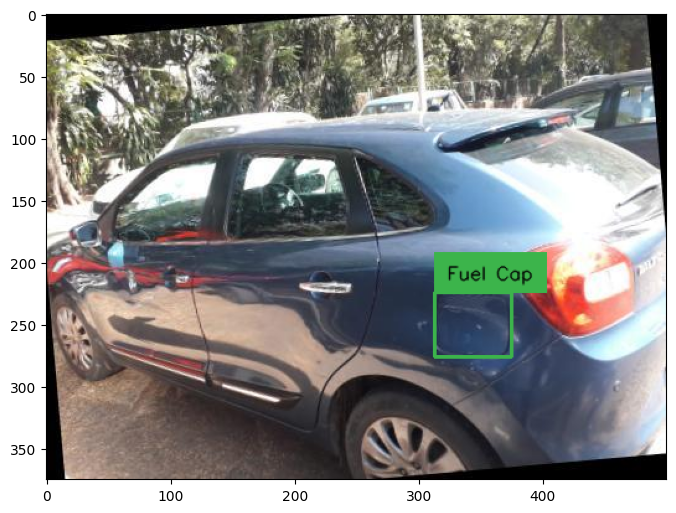

In [12]:
# Visualize if dataset is loaded properly

import random
import cv2
import numpy as np
import supervision as sv


# select random image
image_ids = TRAIN_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# load image and annotatons 
image = TRAIN_DATASET.coco.loadImgs(image_id)[0]
annotations = TRAIN_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TRAIN_DATASET.root, image['file_name'])
image = cv2.imread(image_path)

# annotate
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)

# we will use id2label function for training
categories = TRAIN_DATASET.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}

labels = [
    f"{id2label[class_id]}" 
    for _, _, class_id, _ 
    in detections
]

box_annotator = sv.BoxAnnotator()
frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)

%matplotlib inline  
sv.show_frame_in_notebook(image, (8, 8))


In [13]:
from torch.utils.data import DataLoader

def collate_fn(batch):
    pixel_values = [item[0] for item in batch]
    encoding = image_processor.pad(pixel_values, return_tensors="pt")
    labels = [item[1] for item in batch]
    return {
        'pixel_values': encoding['pixel_values'],
        'pixel_mask': encoding['pixel_mask'],
        'labels': labels
    }

TRAIN_DATALOADER = DataLoader(dataset=TRAIN_DATASET, collate_fn=collate_fn, batch_size=4, shuffle=True)
VAL_DATALOADER = DataLoader(dataset=VAL_DATASET, collate_fn=collate_fn, batch_size=4)
TEST_DATALOADER = DataLoader(dataset=TEST_DATASET, collate_fn=collate_fn, batch_size=4)

import pytorch_lightning as pl

In [14]:
import pytorch_lightning as pl
from transformers import DetrForObjectDetection
import torch


class Detr(pl.LightningModule):

    def __init__(self, lr, lr_backbone, weight_decay):
        super().__init__()
        self.model = DetrForObjectDetection.from_pretrained(
            pretrained_model_name_or_path=CHECKPOINT, 
            num_labels=len(id2label),
            ignore_mismatched_sizes=True
        )
        
        self.lr = lr
        self.lr_backbone = lr_backbone
        self.weight_decay = weight_decay

    def forward(self, pixel_values, pixel_mask):
        return self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    def common_step(self, batch, batch_idx):
        pixel_values = batch["pixel_values"]
        pixel_mask = batch["pixel_mask"]
        labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

        outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

        loss = outputs.loss
        loss_dict = outputs.loss_dict

        return loss, loss_dict

    def training_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)     
        # logs metrics for each training_step, and the average across the epoch
        self.log("training_loss", loss)
        for k,v in loss_dict.items():
            self.log("train_" + k, v.item())

        return loss

    def validation_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)     
        self.log("validation/loss", loss)
        for k, v in loss_dict.items():
            self.log("validation_" + k, v.item())
            
        return loss

    def configure_optimizers(self):
        # DETR authors decided to use different learning rate for backbone
        # you can learn more about it here: 
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L22-L23
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L131-L139
        param_dicts = [
            {
                "params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]},
            {
                "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                "lr": self.lr_backbone,
            },
        ]
        return torch.optim.AdamW(param_dicts, lr=self.lr, weight_decay=self.weight_decay)

    def train_dataloader(self):
        return TRAIN_DATALOADER

    def val_dataloader(self):
        return VAL_DATALOADER


In [15]:
from transformers import DetrForObjectDetection

CHECKPOINT = "facebook/detr-resnet-50"
model = Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)

batch = next(iter(TRAIN_DATALOADER))
outputs = model(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])


/home/sra/.venv/lib/python3.10/site-packages/torch/nn/modules/module.py:2409: UserWarning: for conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/home/sra/.venv/lib/python3.10/site-packages/torch/nn/modules/module.py:2409: UserWarning: for bn1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/home/sra/.venv/lib/python3.10/site-packages/torch/nn/modules/module.py:2409: UserWarning: for bn1.bias: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did 

In [20]:
from pytorch_lightning import Trainer
import torch

# settings
MAX_EPOCHS = 200


    # Try training on GPU
trainer = Trainer(
        devices=1,
        accelerator="gpu",
        max_epochs=MAX_EPOCHS,
        gradient_clip_val=0.1,
        accumulate_grad_batches=8,
        log_every_n_steps=5,
        precision=16,  # use mixed precision to reduce memory
        
    )
torch.save(model.state_dict(), f"checkpoint_epoch_{MAX_EPOCHS}.pth")

trainer.fit(model)


/home/sra/.venv/lib/python3.10/site-packages/lightning_fabric/connector.py:571: `precision=16` is supported for historical reasons but its usage is discouraged. Please set your precision to 16-mixed instead!
Using 16bit Automatic Mixed Precision (AMP)
Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params | Mode
--------------------------------------------------------
0 | model | DetrForObjectDetection | 41.5 M | eval
--------------------------------------------------------
41.3 M    Trainable params
222 K     Non-trainable params
41.5 M    Total params
166.008   Total estimated model params size (MB)
0         Modules in train mode
399       Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/sra/.venv/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


/home/sra/.venv/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 199: 100%|██████████| 976/976 [04:13<00:00,  3.85it/s, v_num=2]

`Trainer.fit` stopped: `max_epochs=200` reached.


Epoch 199: 100%|██████████| 976/976 [04:14<00:00,  3.84it/s, v_num=2]


In [26]:
MODEL_PATH='custom_model'
model.model.save_pretrained(MODEL_PATH) 

model = DetrForObjectDetection.from_pretrained(MODEL_PATH)
device = 'cpu'
model.to(device)

Some weights of DetrForObjectDetection were not initialized from the model checkpoint at custom_model and are newly initialized: ['bbox_predictor.layers.0.bias', 'bbox_predictor.layers.0.weight', 'bbox_predictor.layers.1.bias', 'bbox_predictor.layers.1.weight', 'bbox_predictor.layers.2.bias', 'bbox_predictor.layers.2.weight', 'class_labels_classifier.bias', 'class_labels_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

In [20]:
from transformers import DetrForObjectDetection, DetrImageProcessor
from pycocotools.coco import COCO
import supervision as sv
import torch
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import random

processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")

# Load your model and processor
MODEL_PATH = 'custom_model'
device = 'cuda' if torch.cuda.is_available() else 'cpu'

model = DetrForObjectDetection.from_pretrained(MODEL_PATH).to(device)
# processor = DetrImageProcessor.from_pretrained(MODEL_PATH)

# Load test dataset (COCO format)
ANNOTATION_FILE = "/home/sra/fuel/Fuel Cap.v3i.coco(1)/test/_annotations.coco.json"
IMAGE_ROOT = "/home/sra/fuel/Fuel Cap.v3i.coco(1)/test"
coco = COCO(ANNOTATION_FILE)

# Build label map
id2label = model.config.id2label
box_annotator = sv.BoxAnnotator()

# Random test sample
image_ids = coco.getImgIds()
image_id = random.choice(image_ids)
image_info = coco.loadImgs(image_id)[0]
image_path = os.path.join(IMAGE_ROOT, image_info['file_name'])
image = cv2.imread(image_path)

# Safety check
if image is None:
    raise FileNotFoundError(f"Image not found at {image_path}")


Some weights of DetrForObjectDetection were not initialized from the model checkpoint at custom_model and are newly initialized: ['bbox_predictor.layers.0.bias', 'bbox_predictor.layers.0.weight', 'bbox_predictor.layers.1.bias', 'bbox_predictor.layers.1.weight', 'bbox_predictor.layers.2.bias', 'bbox_predictor.layers.2.weight', 'class_labels_classifier.bias', 'class_labels_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [21]:
annotations = coco.imgToAnns[image_id]
detections_gt = sv.Detections.from_coco_annotations(coco_annotation=annotations)
labels_gt = [f"{id2label.get(class_id, 'Unknown')}" for _, _, class_id, _ in detections_gt]
frame_gt = box_annotator.annotate(scene=image.copy(), detections=detections_gt, labels=labels_gt)


In [22]:
with torch.no_grad():
    inputs = processor(images=image, return_tensors="pt").to(device)
    outputs = model(**inputs)

    target_sizes = torch.tensor([image.shape[:2]]).to(device)
    results = processor.post_process_object_detection(
        outputs=outputs,
        threshold=0.5,
        target_sizes=target_sizes
    )[0]

    detections_pred = sv.Detections.from_transformers(transformers_results=results)
    labels_pred = [
        f"{id2label.get(class_id, 'Unknown')} {score:.2f}"
        for _, score, class_id, _ in detections_pred
    ]
    frame_pred = box_annotator.annotate(scene=image.copy(), detections=detections_pred, labels=labels_pred)


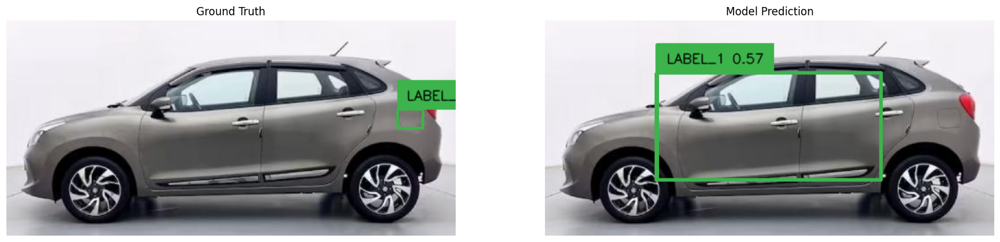

In [23]:
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs[0].imshow(cv2.cvtColor(frame_gt, cv2.COLOR_BGR2RGB))
axs[0].set_title("Ground Truth")
axs[0].axis('off')

axs[1].imshow(cv2.cvtColor(frame_pred, cv2.COLOR_BGR2RGB))
axs[1].set_title("Model Prediction")
axs[1].axis('off')

plt.show()


/home/sra/.venv/lib/python3.10/site-packages/torch/nn/modules/module.py:2409: UserWarning: for conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/home/sra/.venv/lib/python3.10/site-packages/torch/nn/modules/module.py:2409: UserWarning: for bn1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/home/sra/.venv/lib/python3.10/site-packages/torch/nn/modules/module.py:2409: UserWarning: for bn1.bias: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did 

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


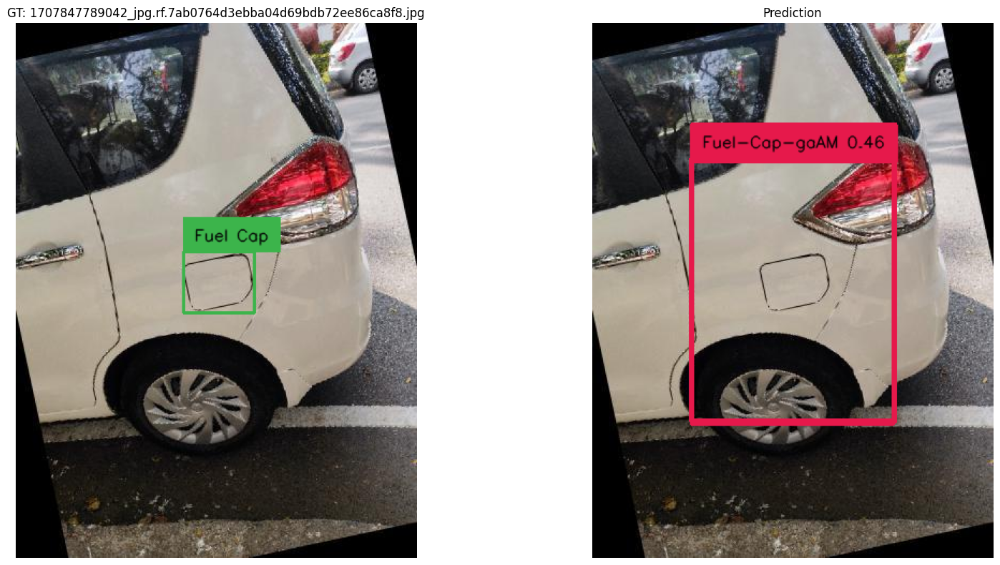

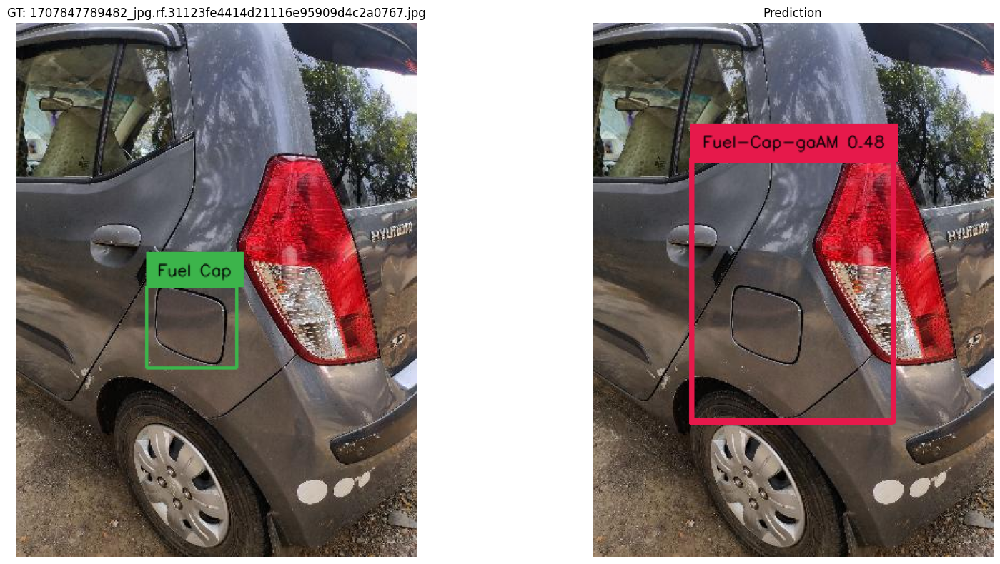

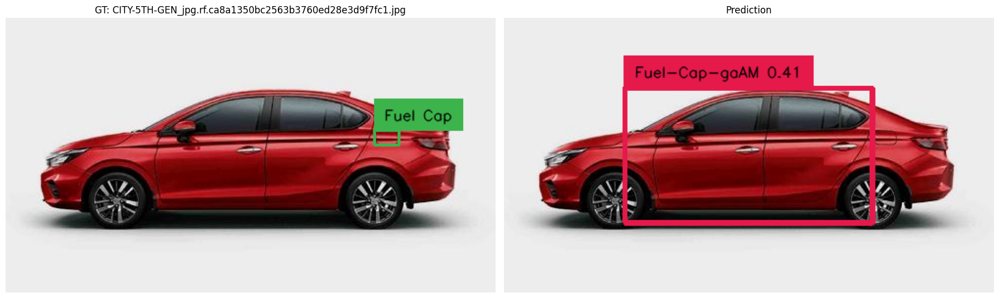

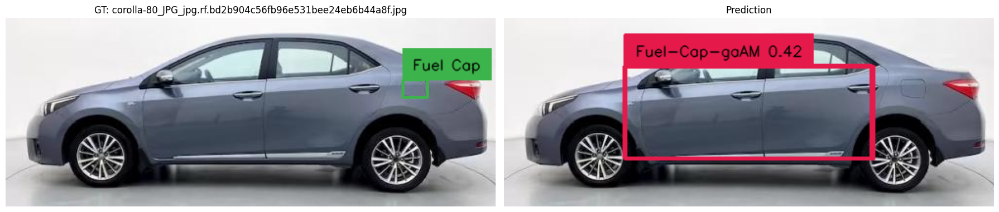

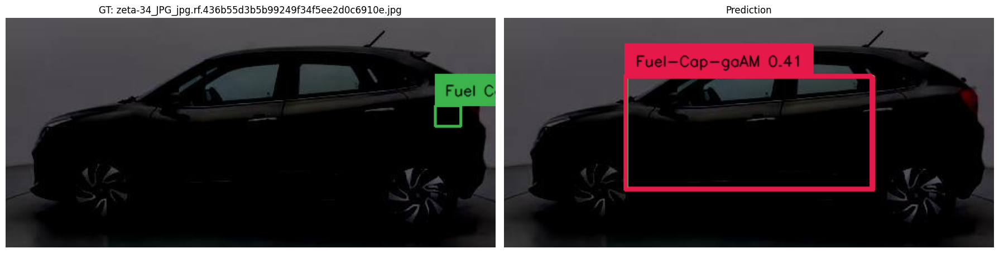

...

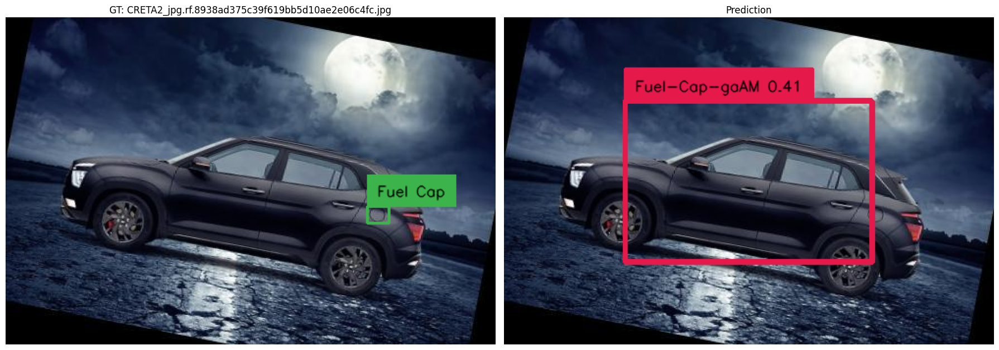

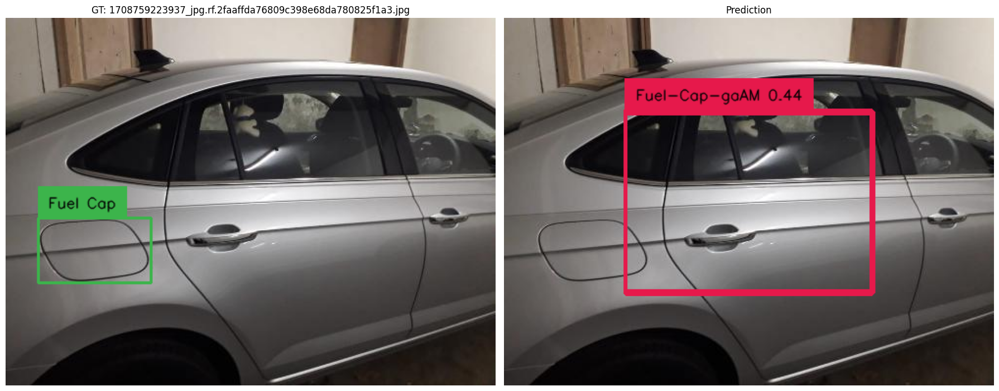

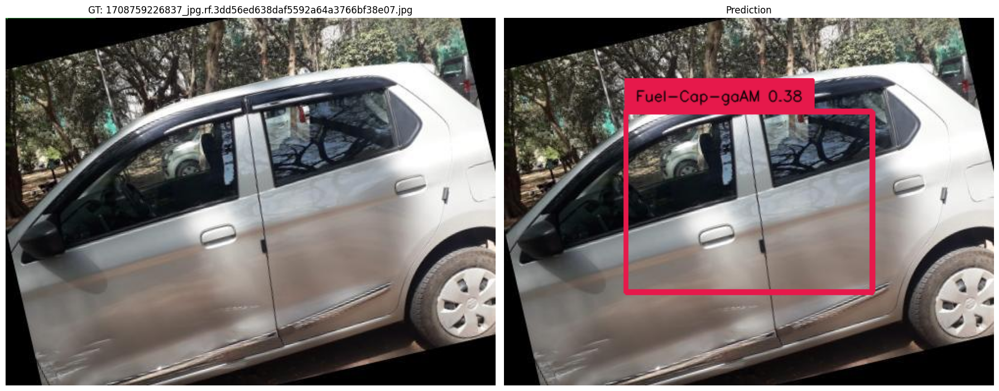

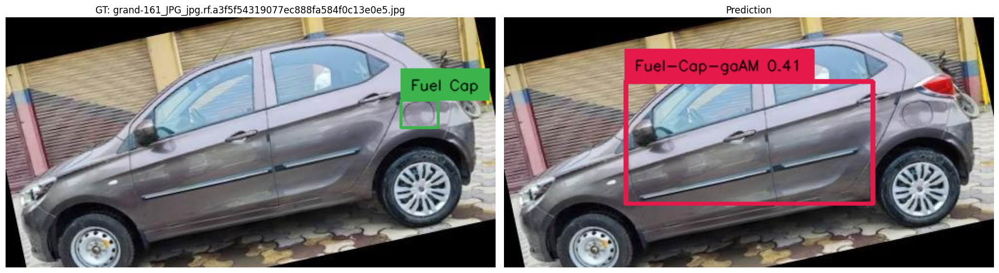

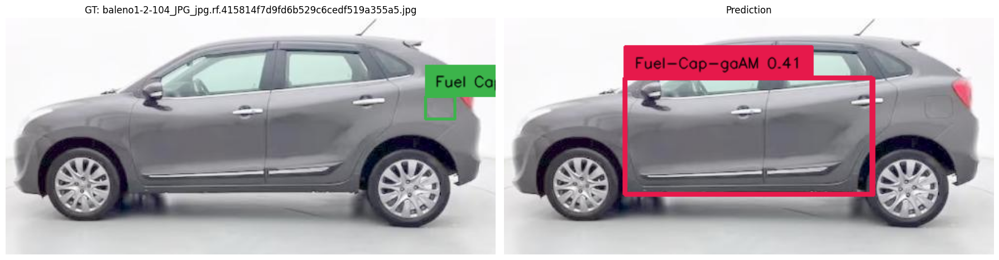

In [38]:
import os
import random
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from transformers import DetrForObjectDetection, DetrImageProcessor
import supervision as sv
from pycocotools.coco import COCO

# ---- CONFIG ----
MODEL_PATH = "custom_model"
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
CONFIDENCE_THRESHOLD = 0.28

# Paths
TEST_DATASET_DIR = "/home/sra/fuel/Fuel Cap.v3i.coco(1)"
ANNOTATIONS_FILE = os.path.join(TEST_DATASET_DIR, "test/_annotations.coco.json")
IMAGES_DIR = os.path.join(TEST_DATASET_DIR, "test")

# Load model & processor
model = DetrForObjectDetection.from_pretrained(MODEL_PATH).to(DEVICE)
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")

# Load COCO
coco = COCO(ANNOTATIONS_FILE)
categories = coco.cats
id2label = {k: v['name'] for k, v in categories.items()}
box_annotator = sv.BoxAnnotator()

# Iterate through images (or limit to N images)
image_ids = coco.getImgIds()
random.shuffle(image_ids)

for image_id in image_ids[:20]:  # change `5` to more if you want
    image_info = coco.loadImgs(image_id)[0]
    image_path = os.path.join(IMAGES_DIR, image_info['file_name'])

    if not os.path.exists(image_path):
        print(f" Skipping: {image_info['file_name']} (not found)")
        continue

    image = cv2.imread(image_path)
    if image is None:
        print(f" Skipping: {image_info['file_name']} (unreadable)")
        continue

    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Ground truth
    annotations = coco.imgToAnns[image_id]
    detections_gt = sv.Detections.from_coco_annotations(coco_annotation=annotations)
    labels_gt = [id2label[class_id] for _, _, class_id, _ in detections_gt]
    frame_gt = box_annotator.annotate(scene=image.copy(), detections=detections_gt, labels=labels_gt)

    # Prediction
    with torch.no_grad():
        inputs = processor(images=image_rgb, return_tensors="pt").to(DEVICE)
        outputs = model(**inputs)
        target_sizes = torch.tensor([image_rgb.shape[:2]]).to(DEVICE)
        results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=CONFIDENCE_THRESHOLD)[0]

        detections_pred = sv.Detections.from_transformers(transformers_results=results)
        labels_pred = [f"{id2label.get(class_id, str(class_id))} {conf:.2f}" for _, conf, class_id, _ in detections_pred]
        frame_pred = box_annotator.annotate(scene=image.copy(), detections=detections_pred, labels=labels_pred)

    # Show result
    fig, axs = plt.subplots(1, 2, figsize=(18, 8))
    axs[0].imshow(cv2.cvtColor(frame_gt, cv2.COLOR_BGR2RGB))
    axs[0].axis('off')
    axs[0].set_title(f"GT: {image_info['file_name']}")

    axs[1].imshow(cv2.cvtColor(frame_pred, cv2.COLOR_BGR2RGB))
    axs[1].axis('off')
    axs[1].set_title("Prediction")

    plt.tight_layout()
    plt.show()


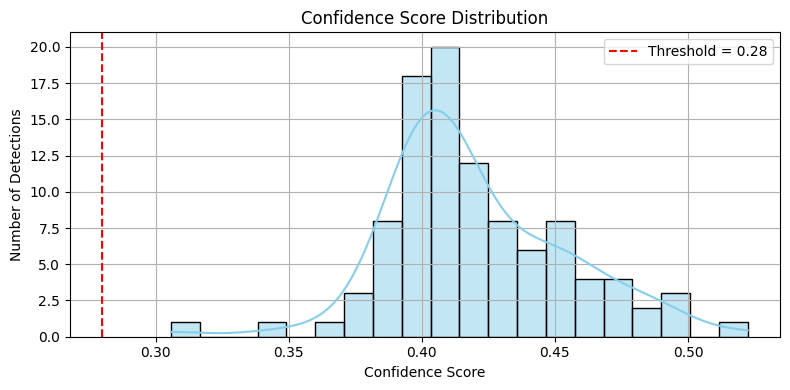

In [39]:
!pip install seaborn
import seaborn as sns

# After: results = processor.post_process_object_detection(...)...

# Plot confidence histogram
confidence_scores = results["scores"].cpu().numpy()

plt.figure(figsize=(8, 4))
sns.histplot(confidence_scores, bins=20, kde=True, color='skyblue')
plt.title("Confidence Score Distribution")
plt.xlabel("Confidence Score")
plt.ylabel("Number of Detections")
plt.axvline(CONFIDENCE_THRESHOLD, color='red', linestyle='--', label=f'Threshold = {CONFIDENCE_THRESHOLD}')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
